<a href="https://colab.research.google.com/github/ChapeuG/Bootcamp-Data-Science-Aplicada-2020/blob/main/Gabriel_Rodrigues_Projeto_Modulo_2v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Resumo:

Olá meu caro leitor, Bem antes de apresentar a minha análise e o meu objetivo devo confessar que foi um desafio trabalhar com a quantidade e pouca informação sobre as vacinas, mas graças a uma frase dentre os artigos que estava lendo me deu uma ideia para ajudar a construir a minha análise.
 
> <img src='https://media.giphy.com/media/oyPTTOQMtuzthM5xKX/giphy.gif'>
 
 
 
 
**“Sete das nove vacinas indicadas para bebês tiveram em 2019 os piores índices de cobertura pelo menos desde 2013 no país.”**
 
Então eu pensei comigo, por que ao invés de usar todos os dados eu não começo em uma faixa etária específica e depois escalo a minha análise, então comecei a analisando as vacinas ao longo dos anos, depois escolhi três vacinas por faixa de idade e levantei hipótese de aumentos ou quedas. 
 
Então após essa epifania, eu te apresento a minha análise.
 
 


O principal objetivo é  apresentar r hipóteses sobre a queda ou aumento na adesão nas campanhas de vacinação será:

* Falta de investimento do governo?
* Falta Conhecimento da população?
* Um movimento que vem surgindo ao longo dos anos ?

Se aconchegue na sua cadeira e venha mergulhar nesse mar de possibilidades comigo.

# Análise dos dados:


##Bibliotecas

In [1]:
import pandas as pd
import numpy as np
import missingno as msno

pd.options.display.float_format = "{:.2f}".format

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.ticker as ticker

In [3]:
#pip install pandas-profiling==2.7.1

In [4]:
#pip install plotly==4.13.0

##Base de dados

In [5]:
#Dados sobre as vacinas por imuno ao longo dos anos
fonte = "https://raw.githubusercontent.com/ChapeuG/Bootcamp-Data-Science-Aplicada-2020/main/dados/TABNET/Vacinas/Cobertura/Coberturas%20Vacinais%20por%20Ano%20segundo%20Imuno.csv"
dados_vacinas_imuno_ano = pd.read_csv(fonte, encoding="ISO-8859-1", na_values='-',
                    sep=";",thousands=".", decimal=",", engine='python')

In [6]:
#Dados sobre a taxa de abandono por imuno ao longo dos anos
fonte = "https://raw.githubusercontent.com/ChapeuG/Bootcamp-Data-Science-Aplicada-2020/main/dados/TABNET/Vacinas/Abandonos/Abandono_por_ano.csv"
dados_vacinas_abandono_ano = pd.read_csv(fonte, encoding="ISO-8859-1", na_values='-',
                    sep=";",thousands=".", decimal=",", engine='python')

In [7]:
#Dados sobre a taxa de abandono por uf ao longo dos anos
fonte = "https://raw.githubusercontent.com/ChapeuG/Bootcamp-Data-Science-Aplicada-2020/main/dados/TABNET/Vacinas/Abandonos/Abandono_por_UF.csv"
dados_vacinas_abandono_uf = pd.read_csv(fonte, encoding="ISO-8859-1", na_values='-',
                    sep=";",thousands=".", decimal=",", engine='python')
#Dados sobre a taxa de abandono por imuno ao longo dos anos
fonte ="https://github.com/ChapeuG/Bootcamp-Data-Science-Aplicada-2020/blob/main/dados/TABNET/Vacinas/Cobertura/cobertura_por_ano_e_uf.xlsx?raw=true"

dados_vacinas_uf_imuno_ano = pd.read_excel(fonte)                    

In [8]:
url = "http://tabnet.datasus.gov.br/cgi/pni/pniimuno.htm"
info_vacinas = pd.read_html(url)[2]

In [9]:
fonte_poli="https://github.com/ChapeuG/Bootcamp-Data-Science-Aplicada-2020/blob/main/dados/TABNET/Vacinas/Abandonos/JustificativasNaoVacinacao_sarampo.xls?raw=true"
justificativa_poli = pd.read_excel(fonte_poli,header=5)

fonte_sarampo ="https://github.com/ChapeuG/Bootcamp-Data-Science-Aplicada-2020/blob/main/dados/TABNET/Vacinas/Abandonos/JustificativasNaoVacinacao_poli.xls?raw=true"

justificativa_sarampo = pd.read_excel(fonte_sarampo,header=5)

In [10]:
fonte ="https://github.com/ChapeuG/Bootcamp-Data-Science-Aplicada-2020/blob/main/dados/TABNET/Vacinas/Calendario.Nacional.Vacinacao.2020.atualizado%20(1).xlsx?raw=true"

calendario_vacina = pd.read_excel(fonte,header=1)

###Tratamento e Análise Exploratória Base de dados
Ajustes para estar usando a base de dados de forma eficiente

Renomeando colunas

In [11]:
info_vacinas.rename(columns={'Tipo de imunobiológico': 'Tipo_de_imunobiológico'}, inplace = True)

In [12]:
justificativa_sarampo.rename(columns={'Unnamed: 0': 'Estado','Unnamed: 1': '(A) Nº de casas visitadas'}, inplace = True)
justificativa_poli.rename(columns={'Unnamed: 0': 'Estado','Unnamed: 1': '(A) Nº de casas visitadas'}, inplace = True)

##Análise Exploratória dos Dados

Essa base foi criado por este que vós fala, vulgo eu, realizei a extração de dados IMUNO por Ano e Região por Imuno e unindo pelo DATASUS.
 
Após ter todos os dados que precisava para iniciar, juntei em uma base só fazendo diversos calculos(PROCV) e assim tive Ano-Região e Imuno em um dataset só.
> <img src='https://media.giphy.com/media/DfSXiR60W9MVq/giphy.gif'>

In [13]:
dados_vacinas_imuno_ano.head(5)

,Imuno,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,Total
0,BCG,88.31,103.63,104.21,117.12,111.61,117.28,111.74,112.60,110.28,108.47,113.36,114.48,113.06,111.08,108.91,108.71,106.71,107.94,105.69,107.42,107.28,105.08,95.55,97.98,99.72,86.67,64.60,105.78
1,Hepatite B em crianças até 30 dias,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,88.54,90.93,81.75,85.88,88.40,78.57,55.75,71.40
2,Rotavírus Humano,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,46.52,79.79,81.18,85.99,83.04,87.06,86.37,93.52,93.44,95.35,88.98,85.12,91.33,85.40,67.57,60.68
3,Meningococo C,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,26.88,105.66,96.18,99.70,96.36,98.19,91.68,87.44,88.49,87.41,68.15,64.08
4,Hepatite B,8.85,10.50,16.50,5.79,12.63,83.50,91.08,91.88,91.47,92.00,96.26,98.46,100.30,99.89,96.06,100.20,96.08,97.71,96.67,100.56,96.42,97.74,105.19,84.40,88.53,70.77,66.19,78.36


>Os dados zerados em algumas colunas não significam que não houve vacinação naquele ano,Algumas vacinas na verdade não existiam em alguns anos e as que deixaram de existir foram mescladas em uma só.
>
>Exemplo a Oral de Rotavírus Humano (RR) começou em 2006  e a do Sarampo foi até o ano de 2003 e depois  foi substituída pela vacina tríplice viral (SCR - sarampo/ caxumba/ rubéola) para aplicação nas crianças de 1 ano de idade na rotina e menores de 5 anos em campanhas de
seguimento.

In [14]:
vacinas=['Oral de Rotavírus Humano (RR)','Contra Rubéola (monovalente)','BCG (BCG)','Contra Sarampo (monovalente)']
busca = f'Tipo_de_imunobiológico in {vacinas}'
info_vacinas.query(busca)

,Tipo_de_imunobiológico,Períodos(a partir de),Doses,"Faixa etária, sexo e condição de gestação"
0,BCG (BCG),1994,1 dose (rotina) Dose 2 (indicações),"menor de 1 ano, 1 ano, 2 anos, 3 anos, 4 anos,..."
18,Contra Rubéola (monovalente),1995 a 2000,dose única,"homens de 12 a 49 anos, não gestantes de 12 a ..."
19,Contra Sarampo (monovalente),1994 a 2003,2 doses,"menor de 1 ano, 1 ano, 2 anos, 3 anos, 4 anos,..."
32,Oral de Rotavírus Humano (RR),2006,2 doses,menor de 1 ano (entre 6 e 24 semanas de vida)


>Para consultar informação mais detalhadas acessar o PDF [Clique Aqui](http://tabnet.datasus.gov.br/cgi/pni/Imun_cobertura_desde_1994.pdf)


In [15]:
import pandas_profiling
report = pandas_profiling.ProfileReport(dados_vacinas_imuno_ano)
report

###Funções

In [16]:
def gera_lineplot(dados,eixo_X,eixo_Y,color,declio_ini,declinio_fim):
  #Gerando gráfico 
  fig = px.line(dados, x=eixo_X, y=eixo_Y, color=color,
                line_group=color, hover_name=color,
          line_shape="spline", labels={"Região": "Região"},
          render_mode="svg")
  fig.update_traces(mode='lines+markers')
  #Adicionando reta da meta
  fig.add_hline(y=95, line_dash="dot",
                annotation_text="Meta de vacinação", 
                annotation_position="bottom right",
                annotation_font_size=12,
                annotation_font_color="blue"
              )
  fig.add_vrect(x0=declio_ini, x1=declinio_fim, 
                annotation_text="Inicio do declinio", annotation_position="top right",
                fillcolor="green", opacity=0.25, line_width=0)

  #Titulo e legendas
  fig.update_layout(height=600, width=800, title_text="COBERTURA DA VACINA DE BCG")
  fig.update_layout(title_text='cobertura da vacina de BCG por região desde 2013',
                    yaxis=dict(title='Cobertura da vacina em porcentagem'),
                    xaxis=dict(title='Ano'),)

  fig.show()

In [17]:
def gera_plot_color(dados,eixo_X,eixo_Y, color):
  fig = px.line(dados, x = eixo_X,y =eixo_Y , color =color)
  fig.add_scatter(x = [2013,2019] ,y=[90,90]);
  fig.show()

def gera_plot(dados,eixo_X,eixo_Y):
  fig = px.line(dados, x = eixo_X,y =eixo_Y )
  fig.show()

def color_negative_red(val):
    """
    Takes a scalar and returns a string with
    the css property `'color: red'` for negative
    strings, black otherwise.
    """

    if val < 90:
      color = 'orange' 
      if val < 75:
        color = 'red'
    else:
     color= 'black'  
    return 'color: %s' % color

##VACINAS

<img src='https://media.giphy.com/media/U2LBRPP4oIFC9IjmYG/giphy.gif'>

Como vou utilizar o calenário de vacinação para crianças vou focar na faixa etaria para menos de 1(um) ano assim facilito a minha análise.

In [18]:
calendario_vacina.head()

,Grupo Alvo,Idade,BCG,Hepatite B,VORH\nRotavírus,Pentavalente (DTP+Hib+ Hep B),DTP,VIP e VOP,Pneumocócica 10,Meningocócica C,Febre Amarela,Tríplice Viral,Tetra Viral,Varicela monovale nte,Hepatite A,HPV,Menigocócica ACWY,Dupla Adulto,dTpa (adulto)
0,NaN,NaN,Formas graves da tuberculose,Hepatite B,Rotavírus,"Difteria, Tétano, Coqueluche, Hepatite B e men...","Difteria, Tétano e Coqueluche",Poliomielite,"Pneumonia, otite, meningite e outras doenças c...",Doença invasiva causada pela Neisseria meningi...,Febre Amarela,Sarampo Caxumba e Rubéola,Sarampo Caxumba Rubéola e Varicela,Varicela,Hepatite A,HPV,Doença invasiva causada pela Neisseria meningi...,Difteria e Tétano,"Difteria, Tétano e Coqueluche"
1,Criança,Ao nascer,Dose Única\n(1),Dose ao nascer (2),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Criança,2 meses,NaN,NaN,1ª dose,1ª dose,NaN,1ª dose VIP\n(1),1ª dose,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Criança,3 meses,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1ª dose,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Criança,4 meses,NaN,NaN,2ª dose,2ª dose,NaN,2ª dose VIP\n(1),2ª dose,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Selecionando as vacinas que vou trabalhar

In [19]:
dados_vacinas_imuno_ano.set_index("Imuno",inplace = True)
dados_vacinas_imuno_ano.head()

,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,Total
Imuno,,,,,,,,,,,,,,,,,,,,,,,,,,,,
BCG,88.31,103.63,104.21,117.12,111.61,117.28,111.74,112.60,110.28,108.47,113.36,114.48,113.06,111.08,108.91,108.71,106.71,107.94,105.69,107.42,107.28,105.08,95.55,97.98,99.72,86.67,64.60,105.78
Hepatite B em crianças até 30 dias,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,88.54,90.93,81.75,85.88,88.40,78.57,55.75,71.40
Rotavírus Humano,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,46.52,79.79,81.18,85.99,83.04,87.06,86.37,93.52,93.44,95.35,88.98,85.12,91.33,85.40,67.57,60.68
Meningococo C,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,26.88,105.66,96.18,99.70,96.36,98.19,91.68,87.44,88.49,87.41,68.15,64.08
Hepatite B,8.85,10.50,16.50,5.79,12.63,83.50,91.08,91.88,91.47,92.00,96.26,98.46,100.30,99.89,96.06,100.20,96.08,97.71,96.67,100.56,96.42,97.74,105.19,84.40,88.53,70.77,66.19,78.36


In [20]:
vacinas_escolhidas = ['BCG','Penta','Poliomielite','Febre Amarela']
dados_vacinas = dados_vacinas_imuno_ano.T[vacinas_escolhidas]
dados_vacinas.head()

Imuno,BCG,Penta,Poliomielite,Febre Amarela
1994,88.31,0.00,58.24,5.27
1995,103.63,0.00,77.83,4.81
1996,104.21,0.00,80.86,5.65
1997,117.12,0.00,89.27,7.84
1998,111.61,0.00,95.30,18.49


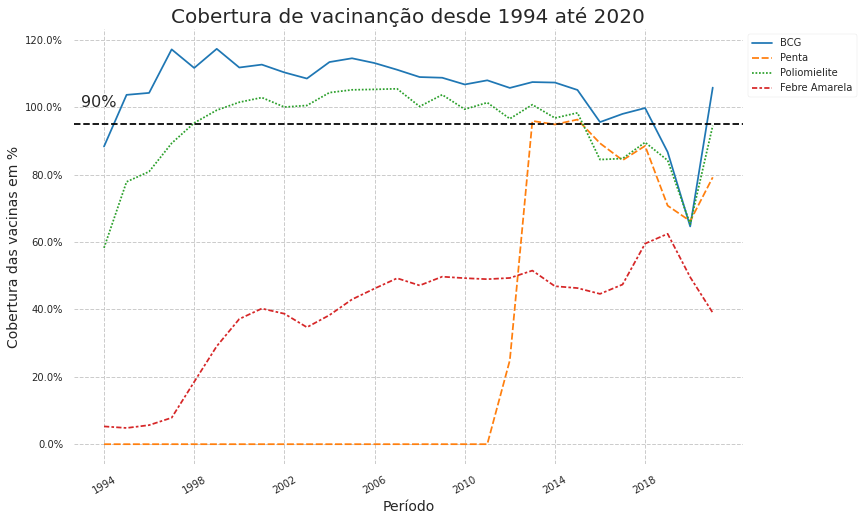

In [21]:
## Gerar gráfico da Cobertura vacinação por vacina
plt.figure(figsize=(12, 8))

ax = sns.lineplot(data=dados_vacinas)
plt.xticks(rotation=30)

#Ticks
ax.xaxis.set_major_locator(ticker.IndexLocator(base=4, offset=0))
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:}%'))

#Reta da meta
plt.axhline(95, color='k', ls='--')
plt.grid(linestyle='--')

#Titulos e legendas 
plt.legend(bbox_to_anchor=(1,1))
plt.title('Cobertura de vacinanção desde 1994 até 2020', fontsize=20)
plt.annotate('90%', xy=(-1,100), fontsize=16);
ax.set_xlabel('Período', fontsize=14)
ax.set_ylabel('Cobertura das vacinas em %', fontsize=14)

plt.show()

In [22]:
#Agrupando por região e ano
por_ano_dos_regiao = dados_vacinas_uf_imuno_ano.groupby(['Região', 'Ano'], as_index=False).sum()
por_ano_dos_regiao.set_index("Região",inplace = True)
por_ano_dos_regiao.sort_values("Ano",ascending=True,inplace = True)
por_ano_dos_regiao.head()

,Ano,BCG,Hepatite B em crianças até 30 dias,Rotavírus Humano,Meningococo C,Hepatite B,Penta,Pneumocócica,Poliomielite,Poliomielite 4 anos,Febre Amarela,Hepatite A,Pneumocócica(1º ref),Meningococo C (1º ref),Poliomielite(1º ref),Tríplice Viral D1,Tríplice Viral D2,Tetra Viral(SRC+VZ),DTP REF (4 e 6 anos),Tríplice Bacteriana(DTP)(1º ref),Dupla adulto e tríplice acelular gestante,dTpa gestante,Total
Região,,,,,,,,,,,,,,,,,,,,,,,
1 Região Norte,2013,113.18,0.00,83.14,89.76,92.52,88.28,79.66,96.47,0.00,90.83,0.00,77.71,78.01,87.50,98.93,46.30,25.41,89.68,83.02,52.49,2.88,68.12
4 Região Sul,2013,108.52,0.00,95.75,103.84,103.80,100.50,100.66,101.47,0.00,62.15,0.00,96.96,94.87,87.02,107.25,75.21,38.03,101.81,88.01,44.38,1.35,75.01
5 Região Centro-Oeste,2013,116.86,0.00,100.99,107.12,107.10,103.80,101.60,109.00,0.00,100.31,0.00,98.83,97.09,100.04,112.38,69.33,34.98,105.89,95.49,54.59,3.14,80.09
2 Região Nordeste,2013,106.32,0.00,90.25,96.30,97.13,92.50,90.27,100.44,0.00,43.00,0.00,91.33,89.40,93.71,111.99,64.34,31.23,94.99,93.40,56.97,4.13,71.91
3 Região Sudeste,2013,104.43,0.00,96.59,102.13,102.95,97.41,95.92,100.18,0.00,33.85,0.00,96.27,96.70,94.35,105.53,76.24,37.38,99.33,91.40,46.92,2.20,73.82


In [23]:
vacinas_escolhidas = ['Ano','Total']
dados_vacinas_regiao = por_ano_dos_regiao[vacinas_escolhidas]

In [24]:
## Gerar gráfico da Cobertura vacinação
fig = px.bar(dados_vacinas_regiao, x='Ano', y='Total',
             color=dados_vacinas_regiao.index,
             barmode = 'group')
#Reta da meta
fig.add_hline(y=90, line_dash="dot",
              annotation_text="Meta de vacinação", 
              annotation_position="bottom right",
              annotation_font_size=20,
              annotation_font_color="blue"
             )
#Titulo e legendas
fig.update_layout(
    title="Valores totais de vacniação por ano",
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    title_font_color="red",
    legend_title_font_color="green"
)
fig.update_xaxes(title_font_family="Arial")
fig.show()

Análise:
 
Temos uma queda muito brusca na cobertura em 2016, seria mais aceitável se fosse diminuindo de forma gradativa, mas saímos de + de 90% da meta para 60% dela.
 
o que será que aconteceu em 2016? vamos às pesquisas!!

<img src='https://media.giphy.com/media/xGdvlOVSWaDvi/giphy.gif'>

Com a ajuda da **@Marcela** descobrimos que em 2016 o Ministério da Saúde admitiu o desabastecimento de vacinas, ou seja, a queda foi causa por falta de estrutura do próprio governo nacional e mundial segundo a reportagem da agencia Brasil

>"Segundo a coordenadora do Programa Nacional de Imunizações, a produção da vacinas no exterior também enfrenta problemas e o fornecimento ao mercado internacional foi afetado. "Estamos falando de um material biológico em que os processos produtivos são sujeitos a instabilidades. Em um momento pode produzir mais, em outra hora menos. O produto também passa por um rigoroso controle de qualidade e se tiver alguma contaminação, tem que ser desprezado"



Em um artigo que li, uma das hipoteses que ele levanta é:

>"Um dos problemas é a falta de vacinas. Nos últimos anos, com frequência recebíamos comunicados do ministério avisando sobre o desabastecimento de alguma vacina", relata Alessandro Chagas, assessor técnico do Conselho Nacional de Secretarias Municipais da Saúde (Conasems)."

Outro fator é a falta de material para vacinação, segundo Isabella Ballalai, vice-presidente da Sociedade Brasileira de Imunizações (SBIm), a escassez de alguns imunizantes levou à adoção de alternativas que dificultam a adesão da população, como a restrição de dias e horários em que uma determinada vacina é aplicada.

>"A BCG é um exemplo. Sempre tivemos altas coberturas, porque o bebê já é vacinado na maternidade. No ano passado, algumas cidades passaram a agendar a vacinação no posto. Aí você já perdea janela de oportunidade."

Então uma das minhas grandes hipoteses além do movimento e fake news, é falta de estrutura e comunicação com a população.

Você pode encontrar todas as referências [Clicando Aqui](https://colab.research.google.com/drive/1Gt335J-uRea2q-Z3G9y7dCKfrgS2J3vv#scrollTo=i9UoBfHvnuAO)

###BCG

A BCG é popularmente conhecida como a vacina da marquinha.


* Para que serve a vacina BGC?
   >A BCG, junto com a Hepatite B, são as primeiras vacinas indicadas para o recém-nascido. Ela protege contra as formas graves da tuberculose, uma doença infectocontagiosa e muito frequente no Brasil.

* Para qual idade ?
    >É indicada para todas as crianças, que devem utilizá-la no primeiro mês de vida, de preferência ainda na maternidade.

* Quais doenças previne ?
   >Ela protege, em mais de 80%, contra as formas mais graves e disseminadas da doença, como a meningite tuberculosa e a tuberculose miliar.

In [25]:
gera_lineplot(por_ano_dos_regiao,'Ano','BCG',por_ano_dos_regiao.index,"2018.75","2020")

Análise:

Mesmo tento algumas quedas ao longo dos anos, como por exemplo em 2019 conseguimos vacinar todas as crianças da meta de 95%, porém em 2019 começou o declinio ou seja, começamos a vacinar abaixo da meta esperada.

###Poliomielite

* Para que serve a vacina Poliomielite?
>A vacina serve para evitar a doença poliomielite e assim, a paralisia infantil.
Tendo duas vacinas 
>
>Vacina Oral Poliomielite (VOP): **negrito** É uma vacina oral (administrada com 2 gotas de 0,1mL diretamente na boca), bivalente, ou seja, composta pelos vírus da pólio tipos 1 e 3, vivos e atenuados.
>
>**Vacina Inativada Poliomielite (VIP):** É uma vacina inativada e incapaz de causar a doença. É uma vacina trivalente e injetável, composta por partículas dos vírus da pólio tipos 1, 2 e 3. A VIP é altamente eficaz na produção de anticorpos ao poliovírus.

* Para qual idade ?
>é recomendada para crianças até os 5 anos de idade.
>As três primeiras doses (2, 4 e 6 meses) devem ser feitas com a VIP,para os reforços (15-18 meses e 5 anos) pode ser utilizada tanto a VIP quanto a VOP.

* Quais doenças previne ?
> paralisia infantil.

In [26]:
gera_lineplot(por_ano_dos_regiao,'Ano','Poliomielite',por_ano_dos_regiao.index,'2015','2020')

Análise:

Podemos ver que começamos a ter uma queda a partir de 2015, a semelhança que encontramos em ambos gráficos é a primeira a apresentar uma queda.
___
Questionamentos:

* Por qual razão o Norte é sempre a primeira região a possuir uma queda ?

* Se o rsponsavel não vacina o filho em uma vacina isso pode se tornar um efeito domino ou pode ter outrps motivos ?

###Penta

* Para que serve a vacina Penta?
>Como o nome sugere, a vacina pentavalente age contra cinco doenças, as quais podem levar a complicações graves e até à morte.

* Para qual idade ?
>É oferecida no primeiro ano de vida do bebê e tem o intuito de reduzir o número de injeções a serem aplicadas, envolvendo diversas imunizações em uma só aplicação.

* Quais doenças previne ?
>Difteria, tétano, coqueluche, poliomielite e Haemophilus influenzae tipo b.

In [27]:
fig = px.line(por_ano_dos_regiao, x='Ano', y='Penta', color=por_ano_dos_regiao.index,
                line_group=por_ano_dos_regiao.index, hover_name=por_ano_dos_regiao.index,
          line_shape="spline", labels={"Região": "Região"},
          render_mode="svg")
fig.show()

In [28]:
gera_lineplot(por_ano_dos_regiao,'Ano','Penta',por_ano_dos_regiao.index,'2015.5','2020')

#Riscos

Segundo os critérios estabelecidos para definição de risco são: 

* **Risco muito baixo**: município com homogeneidade de cobertura vacinal (HCV) = 100%, ou
seja, todas as vacinas com coberturas adequadas;

* **Risco baixo**: Risco baixo – município com homogeneidade de coberturas vacinais ≥ 75% a < 100%, e que alcançaram CV adequada para as vacinas Poliomielite, Tríplice viral e Tetra viral, as quais previnem doenças eliminadas ou em fase de eliminação (Poliomielite, Sarampo e Rubéola), e ainda, a vacina Penta, devido ao componente contra difteria, tétano e pertussis (DTP), considerado internacionalmente como “marcador” de qualidade de serviço de vacinação devido ao esquema de três doses injetáveis até os seis meses de idade

* **Risco médio**: município com homogeneidade de coberturas vacinais ≥ 75% a < 100%, porém, com cobertura vacinal abaixo da meta para uma ou mais das vacinas Poliomielite, Tríplice viral, Tetra viral ou Penta, devido à importância dessas vacinas conforme explicado no item anterior; 

* **Risco alto**: município com homogeneidade de coberturas vacinais < 75%; 

* **Risco muito alto**: município de grande porte populacional, ≥ 100.001 habitantes, e também, com homogeneidade de coberturas vacinais < 75% e com alta Taxa de abandono, ≥ 10%. Incluem-se também, neste grupo de risco, os municípios silenciosos que não registraram nenhum dado de vacinação no ano analisado, independente do porte populacional.

Abaixo afim de facilitar o entendimento, prefiri optar por dois criterios

**Vermelho** =  vacinas que estão abaixo da cobertura de 75% da meta 

**Amarelo** = vacinas que não atingiram 90% da meta

In [29]:
relatorio = por_ano_dos_regiao.reset_index(drop=True).sort_values(by = 'Ano', ascending = False).style.set_table_attributes(
    'class="dataframe"').applymap(color_negative_red)
relatorio

,Ano,BCG,Hepatite B em crianças até 30 dias,Rotavírus Humano,Meningococo C,Hepatite B,Penta,Pneumocócica,Poliomielite,Poliomielite 4 anos,Febre Amarela,Hepatite A,Pneumocócica(1º ref),Meningococo C (1º ref),Poliomielite(1º ref),Tríplice Viral D1,Tríplice Viral D2,Tetra Viral(SRC+VZ),DTP REF (4 e 6 anos),Tríplice Bacteriana(DTP)(1º ref),Dupla adulto e tríplice acelular gestante,dTpa gestante,Total
39,2020,71.770000,64.120000,72.570000,73.830000,69.510000,69.510000,76.900000,69.890000,68.440000,60.830000,70.190000,69.440000,71.320000,65.200000,69.710000,61.980000,52.220000,72.230000,72.600000,17.360000,48.880000,65.110000
38,2020,74.110000,59.680000,75.730000,76.260000,73.490000,73.490000,78.430000,73.260000,72.360000,60.200000,73.710000,66.670000,74.300000,68.830000,74.090000,69.350000,56.450000,73.820000,77.980000,22.120000,46.190000,67.620000
37,2020,60.950000,49.270000,68.500000,68.360000,71.970000,71.970000,70.770000,66.840000,64.750000,57.160000,67.330000,63.880000,68.320000,61.330000,73.290000,55.290000,3.810000,73.050000,71.780000,16.260000,36.120000,59.270000
36,2020,68.760000,62.520000,59.770000,61.900000,54.350000,54.350000,66.340000,56.150000,39.920000,48.410000,56.170000,58.910000,60.130000,49.200000,59.850000,50.530000,42.760000,49.140000,58.740000,24.250000,44.920000,53.600000
35,2020,61.370000,57.880000,63.790000,64.620000,58.000000,58.000000,68.140000,61.320000,45.190000,29.620000,61.100000,60.760000,64.180000,54.980000,69.070000,48.250000,2.910000,50.770000,63.370000,22.850000,39.950000,52.980000
32,2019,88.080000,75.780000,90.550000,93.400000,74.700000,74.700000,92.770000,89.040000,89.100000,76.560000,91.380000,89.160000,91.860000,81.660000,92.670000,90.240000,84.530000,68.910000,66.950000,48.300000,69.240000,81.920000
30,2019,91.040000,85.990000,80.490000,84.230000,70.270000,70.270000,88.390000,79.590000,53.750000,69.030000,79.010000,80.600000,82.860000,67.610000,88.270000,77.200000,67.360000,46.770000,52.780000,49.400000,65.510000,72.770000
31,2019,85.390000,80.530000,84.040000,86.320000,71.360000,71.340000,88.530000,82.730000,55.020000,32.950000,82.330000,82.310000,84.890000,71.200000,94.420000,76.320000,6.370000,47.450000,56.950000,46.960000,63.860000,69.240000
33,2019,84.410000,73.590000,85.630000,86.670000,69.070000,69.050000,88.160000,84.540000,75.500000,71.960000,86.170000,82.270000,84.630000,75.800000,94.060000,82.870000,16.700000,57.050000,56.470000,40.920000,58.970000,72.720000
34,2019,93.760000,90.580000,86.740000,88.890000,71.070000,71.060000,90.080000,85.400000,76.110000,77.900000,85.940000,87.420000,88.040000,78.000000,91.280000,84.220000,77.470000,48.490000,49.840000,47.130000,69.010000,78.180000


Para facilitar vamos olhar somente pelo total de vacinação 

In [30]:
total = por_ano_dos_regiao.reset_index()
total_df = total[['Ano','Região','Total']]

In [31]:
total_df.style.set_table_attributes(
    'class="dataframe"').applymap(color_negative_red,
                  subset=pd.IndexSlice[:, ['Total']])

,Ano,Região,Total
0,2013,1 Região Norte,68.120000
1,2013,4 Região Sul,75.010000
2,2013,5 Região Centro-Oeste,80.090000
3,2013,2 Região Nordeste,71.910000
4,2013,3 Região Sudeste,73.820000
5,2014,5 Região Centro-Oeste,94.420000
6,2014,3 Região Sudeste,98.510000
7,2014,2 Região Nordeste,95.400000
8,2014,4 Região Sul,94.240000
9,2014,1 Região Norte,83.050000


Análise:

Podemos ver que a partir de 2016 tivemos uma queda brusca no total de vacinação, o idela seria olhar por Municipio dessas regiões e catalogar para cada faixa de risco, porém olhando de forma superficial podemos encaixar todas as regiões em risco alto ou muito alto.

O motivo de ter utilizado 2020 é para mostrar que or conta da pandemia a chance de bater a meta é muito baixo e esse panorama e nivel mudial 

>"Mais de 80 milhões de crianças com menos de um ano correm risco de contrair doenças que podem ser evitadas por vacinas, segundo OMS" 

[Taxa de vacinação cai em todo o mundo devido à pandemia de coronavírus](https://www.medicina.ufmg.br/taxa-de-vacinacao-cai-em-todo-o-mundo-devido-a-pandemia-de-coronavirus/)

##Provaveis motivos das pessoas não vacinarem suas filhas ou filhos

Infelizmente não tem muita informção disponivel por qual motivo não houve a vacinação nas crianças, o unico site que achei foi esse e que só possui informações de 2018 [link](http://sipni-gestao.datasus.gov.br/si-pni-web/faces/relatorio/consolidado/justificativasNaoVacinacaoMrc.jsf)

In [32]:
justificativa_sarampo.head()

,Estado,(A) Nº de casas visitadas,Quantidade,Quantidade.1,Sem comprovante\t,Falta de tempo\t,Dificuldade de ir ao posto de vacinação\t,Recusa da vacina\t,Posto de vacinação fechado\t,Faltou vacina\t,Contra indicação médica\t,Evento adverso em dose anterior\t,Várias injeções ao mesmo tempo\t,Não estava agendada\t,Outros motivos,Total de justificativas
0,11 - RONDONIA,2488.00,2965.00,2949.00,3.00,5.00,11.00,1.00,2.00,2.00,0.00,1.00,0.00,0.00,29.00,54.00
1,12 - ACRE,1113.00,2789.00,2754.00,1.00,22.00,7.00,3.00,0.00,1.00,0.00,1.00,1.00,1.00,25.00,62.00
2,13 - AMAZONAS,15356.00,17562.00,17478.00,138.00,324.00,160.00,60.00,11.00,187.00,11.00,3.00,9.00,17.00,354.00,1274.00
3,14 - RORAIMA,1697.00,1745.00,1705.00,3.00,26.00,6.00,1.00,1.00,1.00,2.00,0.00,0.00,4.00,59.00,103.00
4,15 - PARA,31079.00,38911.00,35355.00,113.00,301.00,145.00,23.00,9.00,85.00,0.00,0.00,5.00,20.00,924.00,1625.00


Quantas informações, vamos somar o total de cada coluna e ver quais são as justificativas que mais foram usadas

In [33]:
lista_motivos = ['Sem comprovante\t', 'Falta de tempo\t',
       'Dificuldade de ir ao posto de vacinação\t', 'Recusa da vacina\t',
       'Posto de vacinação fechado\t', 'Faltou vacina\t',
       'Contra indicação médica\t', 'Evento adverso em dose anterior\t',
       'Várias injeções ao mesmo tempo\t', 'Não estava agendada\t',
       'Outros motivos', 'Total de justificativas']

Fazendo a soma dos motivos

In [34]:
justificativa_sarampo_soma = justificativa_sarampo[lista_motivos].sum().sort_values(ascending = False)
justificativa_poli_soma = justificativa_poli[lista_motivos].sum().sort_values(ascending = False)

Criando um Dataframe  para visualizar os dados

In [35]:
df = pd.DataFrame({'Sarampo': justificativa_sarampo_soma,'Poliomielite':justificativa_poli_soma})
df['Total']= df['Sarampo']+ df['Poliomielite']
df.sort_values('Total',ascending=False,inplace=True)
df.head()

,Sarampo,Poliomielite,Total
Total de justificativas,58221.00,66051.00,124272.00
Outros motivos,22134.00,24840.00,46974.00
Falta de tempo\t,17100.00,16587.00,33687.00
Dificuldade de ir ao posto de vacinação\t,4767.00,9492.00,14259.00
Faltou vacina\t,4611.00,5103.00,9714.00


In [36]:
fig = px.bar(df, x=df.index, y=['Total','Poliomielite','Sarampo'], title="Justificativas de Não vacinação em 2018")

fig.update_layout(barmode='group')
fig.show()

Analisando o gráfico brevemente as justificativas mais utilizadas foram a Falta de tempo e dificuldade para ir até o posto de vacinação.

O que leva a várias hipoteses como a dificuldade de ir ao posto é por questão de locomoção? a falta de tempo é por causa do trabalho? 

Um numero que chama a atenção é que ao somar a recusa da vacina de ambas justificativas temos 3.093 se recusando a vacinar, além de colocar as próprias crianças em perigo colocam as 2.472 crianças que não podem tomar vacina por motivos medicos de relance podem parecer numeros pequenos comparado a quantidade de brasileiros que temos, porém foi um numero relativamente pequeno de casas entrevistadas sendo só 2 378 835 casas.

In [37]:
justificativa_sarampo['(A) Nº de casas visitadas'].sum()

2378835.0

#Conclusão

Finalizando infelizmente a quantidade de dados para trabalhar foi bem escassa o que acabou atrapalhando para realizar conclusões ou hipóteses mais profunda, mas usando o que foi apresentado podemos colocar que temos três pilares principais que diminuem a adesão das vacinas 
 
>1. Falta de estrutura e investimento do governo: O fortalecimento da produção nacional de vacina é um dos grandes desafios do Brasil, sendo por conta do "produto" biológico vivo e, se há alguma contaminação, ele deve ser desprezado e a produção começa do zero e a falta investimentos financeiros para renovar e adequar as fábricas produtoras dos laboratórios e os laboratórios públicos para evitar a falta de vacinas.
>
>A falta de investimento acaba deixando todo o sistema de saúde precário, o que acaba gerando uma escassez das vacinas e perdendo como já citado janelas de oportunidade de vacinação.
___
>2. Notícias falsas e movimento antivax: Notícias falsas e movimento antiwax:  A falta de conhecimento sobre o benefício da vacina por parte da população acaba os deixando suscetíveis a disseminação de informações falsas a respeito de vacinas, algumas pessoas temem procurar a imunização. Mas é preciso saber que as vacinas são seguras. [Sete a cada dez brasileiros acreditam em informações falsas sobre vacinação](https://sbim.org.br/noticias/1139-sete-a-cada-dez-brasileiros-acreditam-em-informacoes-falsas-sobre-vacinacao)
___
>3. Conscientização da população:Para especialistas em imunização, embora os movimentos antivacina tenham um impacto na diminuição da adesão, os principais motivos para a queda da cobertura vacinal no País são a baixa percepção de risco da população sobre doenças erradicadas e dificuldades no acesso ao imunizante nos postos.
"Um dos problemas é a falta de vacinas. Nos últimos anos, com frequência recebemos comunicados do ministério avisando sobre o desabastecimento de alguma vacina", relata Alessandro Chagas, assessor técnico do Conselho Nacional de Secretarias Municipais da Saúde (Conasems).
 
Infelizmente a falta de informações (números) acabou me prejudicando a realizar uma análise ainda maior.
 
 


<img src='https://media.giphy.com/media/3GjLlt2Pd7f4r2rrhz/giphy.gif'>


#Bibliografia, Referências e Artigos


>[Abastecimento de vacinas se normalizará em 2017, diz Ministério da Saúde](https://agenciabrasil.ebc.com.br/geral/noticia/2016-09/abastecimento-de-vacinas-se-normalizara-em-2017-diz-ministerio-da-saude)

>[Ministério da Saúde admite o desabastecimento de vacinas](https://jovempan.com.br/programas/ministerio-da-saude-admite-o-desabastecimento-de-vacinas.html)

>[IMUNIZAÇÃO: País tem pior índice de cobertura da série histórica nas principais vacinas](https://rondoniaovivo.com/noticia/brasilemundo/2020/09/05/imunizacao-pais-tem-pior-indice-de-cobertura-da-serie-historica-nas-principais-vacinas.html)

>[Brasil tem piores índices de cobertura da série histórica nas principais vacinas](https://www.cnnbrasil.com.br/saude/2020/09/05/pais-tem-piores-indices-de-cobertura-da-serie-historica-nas-principais-vacinas)

>[A queda da imunização no Brasil](https://www.conass.org.br/queda-da-imunizacao-no-brasil/)

>[Coberturas vacinais no Brasil](https://portalarquivos2.saude.gov.br/images/pdf/2017/agosto/17/AACOBERTURAS-VACINAIS-NO-BRASIL---2010-2014.pdf)

>[Boletim de imunização ](http://www.saude.ba.gov.br/wp-content/uploads/2017/11/2019-Boletim-calendário-vacinal-da-criança.pdf)

>[Sarampo, pólio, difteria… Por que doenças erradicadas estão voltando?](http://www.femipa.org.br/noticias/sarampo-polio-difteria-por-que-doencas-erradicadas-estao-voltando/#:~:text=Além%20do%20sarampo%20e%20da,que%20está%20voltando%3A%20a%20difteria.)

>[Não é só sarampo: por que outras doenças erradicadas estão voltando?](https://www.minhavida.com.br/saude/materias/36916-nao-e-so-sarampo-por-que-outras-doencas-erradicadas-estao-voltando)

**Dados**

**TABNET**
Dados sobre as imunizações desde 1994

link: http://tabnet.datasus.gov.br/cgi/deftohtm.exe?sih/cnv/nruf.def

Data de uso:27/11/2000

Périodo utilizado:Jan 2008 à Ago 2020